In [1]:
%load_ext autoreload
%autoreload 2

import sys, os
sys.path.insert(0, '../')
sys.path.insert(0, '../python_src/')

import numpy as np
import scipy as sp
import numpy.random as rand
import numpy.linalg as la
import gzip
import cPickle as pickle
import matplotlib.pyplot as plt; plt.rcdefaults()
import seaborn as sns
import networkx as nx
import itertools as it
%matplotlib inline

import matplotlib as mpl
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib import collections as mc

import mech_network_solver as mns
import network
import tuning_algs as talgs
import network_plot as nplot

Loading Mechanical Network Deformation Solver Module


In [12]:
DIM = 2

NN = 512
Lp = -1.0
irec = 100
Delta = 1.0
NTS = 1


NDISC = 1.0

rand.seed(irec)


nw_label = "networks_spring_disc_3/db_N00008192_Lp-1.40/N00008192_Lp-1.40_radius0.08838835"
net = network.loadFiniteRandomNetwork(nw_label, irec)
com = net.L / 2.0

net.L *= 1.2

for i in range(net.NN):
    net.node_pos[2*i:2*i+2] += net.L/2 - com 



# nw_label = "network_periodic_jammed/network_N{:05d}_Lp{:.2f}/network_irec{:04d}".format(NN, Lp, irec)

# with open("/data1/home/rocks/data/{:}.pkl".format(nw_label), 'rb') as pkl_file:

#     nw_data = pickle.load(pkl_file)
#     net = nw_data['network'] 


NF = 1


edgei = net.edgei
edgej = net.edgej


inodesi = [[] for t in range(NF)]
inodesj = [[] for t in range(NF)]
istrain_bonds = [[] for t in range(NF)]

onodesi = [[] for t in range(NF)]
onodesj = [[] for t in range(NF)]
ostrain_bonds = [[] for t in range(NF)]



##################################################

L = np.copy(net.L)

pos = np.array([0.1*L[0], 0.5*L[1]])
s = network.closestEdge(net, pos)[0]


inodesi[0].append(edgei[s])
inodesj[0].append(edgej[s])
istrain_bonds[0].append(s)

pos = np.array([0.9*L[0], 0.5*L[1]])
b = network.closestEdge(net, pos)[0]

onodesi[0].append(edgei[b])
onodesj[0].append(edgej[b])
ostrain_bonds[0].append(b)
    
# edge = range(net.NE)

# rand.shuffle(edge)

# for i in range(NTS):
#     b = edge.pop()

#     onodesi[0].append(edgei[b])
#     onodesj[0].append(edgej[b])
#     ostrain_bonds[0].append(b)

######################################################



#update for 1D networks
# isvec = [[] for t in range(NF)]
# for t in range(NF):
#     for (i, j) in zip(inodesi[t], inodesj[t]):
#         posi = net.node_pos[DIM*i:DIM*i+DIM]
#         posj = net.node_pos[DIM*j:DIM*j+DIM]
#         bvec = posj - posi
#         bvec -= np.round(bvec/net.L)*net.L
#         isvec[t].extend(bvec) 

# istrain = [[] for t in range(NF)]
# istrain[0].append(1.0)


# osvec = [[] for t in range(NF)]
# ostrain = [[] for t in range(NF)]
# for t in range(NF):
#     for (i, j) in zip(onodesi[t], onodesj[t]):
#         posi = net.node_pos[DIM*i:DIM*i+DIM]
#         posj = net.node_pos[DIM*j:DIM*j+DIM]
#         bvec = posj - posi
#         bvec -= np.round(bvec/net.L)*net.L
#         osvec[t].extend(bvec) 


#         ostrain[t].append(Delta)

pert = []
meas = []
for t in range(NF):
    pert.append(talgs.Perturb())
#     pert[t].setInputStress(len(istrain_bonds[t]), istrain_bonds[t], istrain[t])
    pert[t].setInputStrain(len(inodesi[t]), inodesi[t], inodesj[t], istrain_bonds[t], istrain[t], isvec[t])

    meas.append(talgs.Measure())
#     meas[t].setOutputStress(len(ostrain_bonds[t]), ostrain_bonds[t])
    meas[t].setOutputStrain(len(onodesi[t]), onodesi[t], onodesj[t], ostrain_bonds[t], osvec[t])

obj_func = mns.CyIneqRatioChangeObjFunc(len(np.concatenate(ostrain)), net.NE, 
                                        np.zeros(len(np.concatenate(ostrain)), float), np.concatenate(ostrain),
                                       relative=False, change=False)    



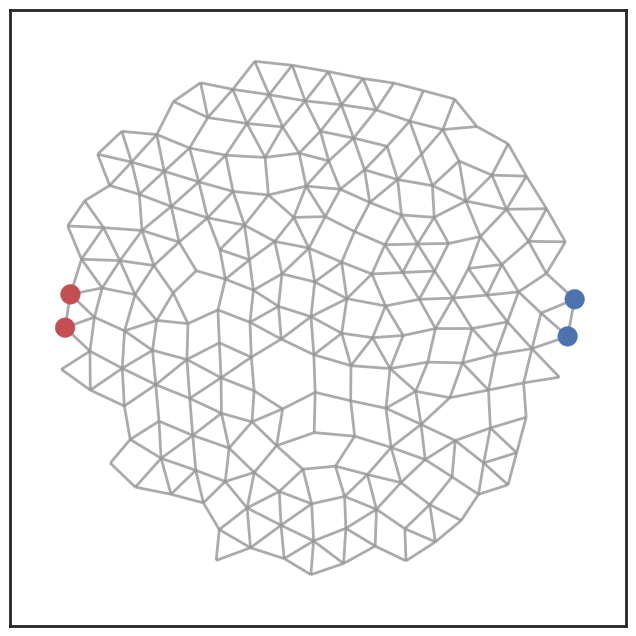

In [13]:
mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)


styles = {edge: {} for edge in range(net.NE)}
    
nplot.show_network(ax1, net, styles=styles)

styles = {}
for i in inodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
for i in inodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
    
for i in onodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'
for i in onodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'

nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

ax1.get_xaxis().set_ticks([])
ax1.get_yaxis().set_ticks([])

plt.savefig("talk_figs/plain_network.png")

plt.show()

In [14]:
net1d = network.convertToFlowNetwork(net)   

K_max = np.ones(net.NE, float) / net1d.eq_length

K_disc = np.ones(net.NE, float)


tuner = talgs.TuneDiscLin(net1d, pert, meas, obj_func, K_max, K_disc, NDISC=NDISC)

data = tuner.tune()

print data


tuner.solver.setIntStrengths(data['K'])
(disp, strain) = tuner.solver.solveDOF()
data['disp'] = disp[0]

tuner.solver.setIntStrengths(K_max)
(disp, strain) = tuner.solver.solveDOF()
data['disp_init'] = disp[0]

Initial objective function: 0.498953437805
Removing 0 / 465.0 / 465 bonds would create zero modes...
{'disc': 0.0, 'bond': 420}
0 Objective function: 0.497749202278 Change: -0.00120423552633 Percent: -0.241352285622 %
Removing 0 / 464.0 / 465 bonds would create zero modes...
{'disc': 0.0, 'bond': 241}
1 Objective function: 0.495180352976 Change: -0.00256884930266 Percent: -0.516093102892 %
Removing 1 / 463.0 / 465 bonds would create zero modes...
{'disc': 0.0, 'bond': 10}
2 Objective function: 0.492204177068 Change: -0.00297617590725 Percent: -0.601028673565 %
Removing 1 / 462.0 / 465 bonds would create zero modes...
{'disc': 0.0, 'bond': 363}
3 Objective function: 0.489114288153 Change: -0.00308988891526 Percent: -0.62776568327 %
Removing 1 / 461.0 / 465 bonds would create zero modes...
{'disc': 0.0, 'bond': 70}
4 Objective function: 0.486734273624 Change: -0.0023800145287 Percent: -0.486596811082 %
Removing 1 / 460.0 / 465 bonds would create zero modes...
{'disc': 0.0, 'bond': 104}
5

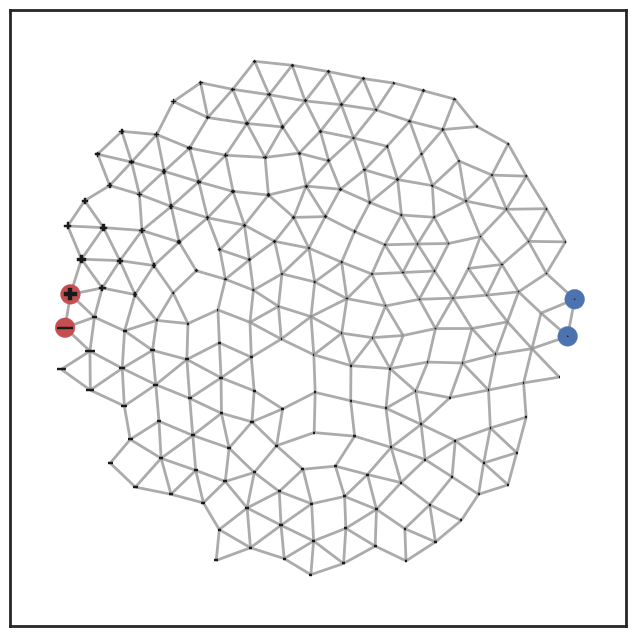

In [15]:
mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

disp = data['disp_init']


styles = {edge: {} for edge in range(net.NE)}
    
nplot.show_network(ax1, net, styles=styles)

styles = {}
for i in inodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
for i in inodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
    
for i in onodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'
for i in onodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'

nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

styles = {}
for node in range(net.NN):
    
    if disp[node] > 0.0:
        styles[node] = {}
        styles[node]['size'] = 200*np.abs(disp[node])
        
nplot.show_nodes(ax1, net, styles.keys(), styles=styles, marker='P')

styles = {}
for node in range(net.NN):
    
    if disp[node] < 0.0:
        styles[node] = {}
        styles[node]['size'] = 200*np.abs(disp[node])
        
nplot.show_nodes(ax1, net, styles.keys(), styles=styles, marker='_')

ax1.get_xaxis().set_ticks([])
ax1.get_yaxis().set_ticks([])


plt.savefig("talk_figs/init_flow_input_pressure_pressure.png")
# plt.savefig("talk_figs/init_flow_input_current_pressure.png")



plt.show()

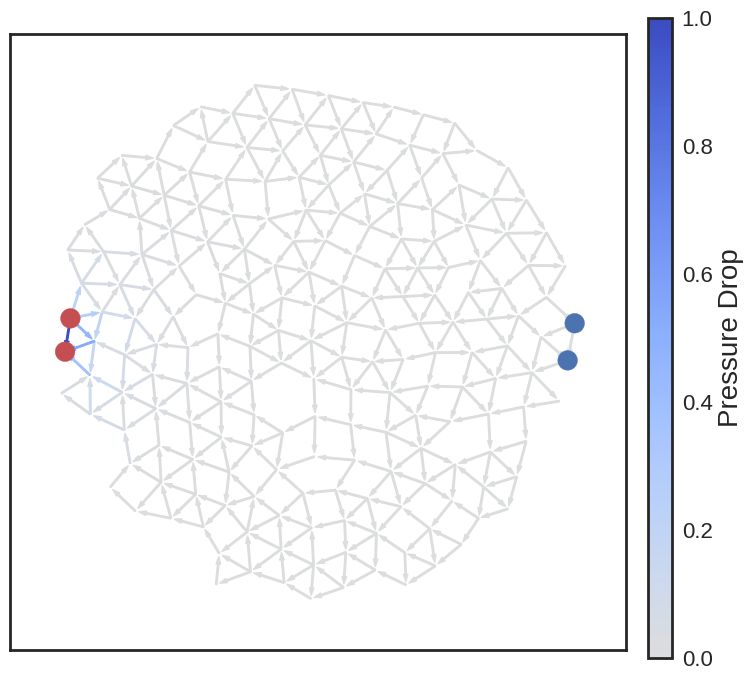

In [16]:
def potential(net, disp):
    edgei = np.copy(net.edgei)
    edgej = np.copy(net.edgej)
    node_pos = np.copy(net.node_pos)
    DIM = net.DIM
    NE = net.NE
    NN = net.NN
    L = np.copy(net.L)
    
    ext = np.zeros(NE, float)
    for i in range(NE):
        
        posi = node_pos[DIM*edgei[i]:DIM*edgei[i]+DIM]
        posj = node_pos[DIM*edgej[i]:DIM*edgej[i]+DIM]

        bvec = posj - posi
        bvec -= np.round(bvec/net.L)*net.L
        
        bhat = bvec / la.norm(bvec)
        
        dispi = disp[edgei[i]]
        dispj = disp[edgej[i]]
        
        ext[i] = dispj - dispi
        
    return ext

mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

disp = data['disp_init']


styles = {edge: {} for edge in range(net.NE)}
    
ext = potential(net, disp)
        
limit = np.abs(np.max(ext))
norm = mcolors.Normalize(vmin=0.0, vmax=limit)
# norm = mcolors.Normalize(vmin=np.min(ext), vmax=np.max(ext))

ocmap = mpl.cm.coolwarm_r
cmap = mcolors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=ocmap.name, a=0.0, b=1.0),
        ocmap(np.linspace(0.5, 1.0, 100)))


smap = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

for edge in range(net.NE):
    styles[edge]['color'] = smap.to_rgba(np.abs(ext[edge]))
    styles[edge]['orient'] = -np.sign(ext[edge])
    
    
nplot.show_network(ax1, net, styles=styles, oriented=True, alpha=1.0)

styles = {}
for i in inodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
for i in inodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
    
for i in onodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'
for i in onodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'

nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

# nplot.show_vecs(ax1, net, disp)


cax = fig.add_axes([0.925, 0.10, 0.03, 0.80])
cbar = mpl.colorbar.ColorbarBase(cax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')

cbar.ax.tick_params(labelsize=16) 
cbar.set_label("Pressure Drop", fontdict={'fontsize': 20})

ax1.get_xaxis().set_ticks([])
ax1.get_yaxis().set_ticks([])


plt.savefig("talk_figs/init_flow_input_pressure_pressure_drop.png")
# plt.savefig("talk_figs/init_flow_input_current_pressure_drop.png")



plt.show()

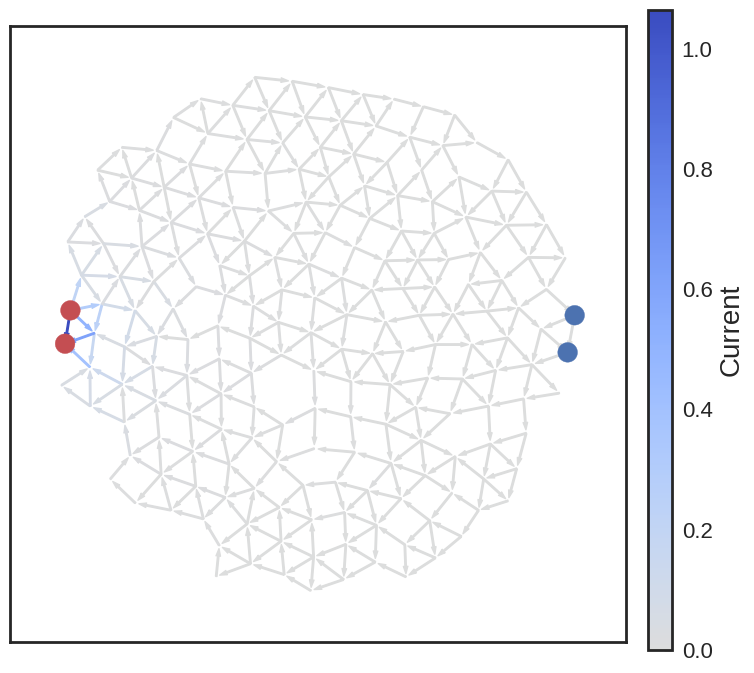

In [17]:
mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

disp = data['disp_init']


styles = {edge: {} for edge in range(net.NE)}
    
    
current = potential(net, disp) * K_max
        
limit = np.abs(np.max(current))
norm = mcolors.Normalize(vmin=0.0, vmax=limit)
# norm = mcolors.Normalize(vmin=np.min(ext), vmax=np.max(ext))

ocmap = mpl.cm.coolwarm_r
cmap = mcolors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=ocmap.name, a=0.0, b=1.0),
        ocmap(np.linspace(0.5, 1.0, 100)))


smap = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

   

for edge in range(net.NE):
    styles[edge]['color'] = smap.to_rgba(np.abs(current[edge]))
    styles[edge]['orient'] = -np.sign(current[edge])
    
    
nplot.show_network(ax1, net, styles=styles, oriented=True, alpha=1.0)

styles = {}
for i in inodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
for i in inodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
    
for i in onodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'
for i in onodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'

nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

# nplot.show_vecs(ax1, net, disp)


cax = fig.add_axes([0.925, 0.10, 0.03, 0.80])
cbar = mpl.colorbar.ColorbarBase(cax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')

cbar.ax.tick_params(labelsize=16) 
cbar.set_label("Current", fontdict={'fontsize': 20})

ax1.get_xaxis().set_ticks([])
ax1.get_yaxis().set_ticks([])


plt.savefig("talk_figs/init_flow_input_pressure_current.png")
# plt.savefig("talk_figs/init_flow_input_current_current.png")



plt.show()

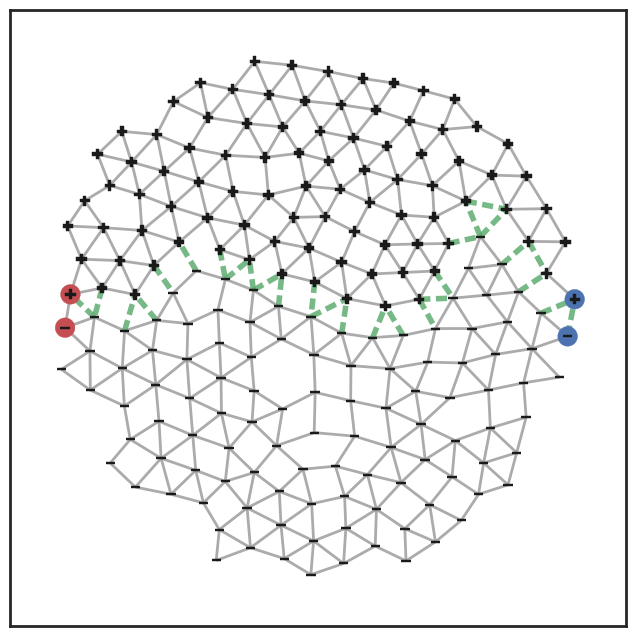

In [18]:
mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

disp = data['disp']/2
removed = np.where(data['K_disc'] == 0.0)[0]



styles = {edge: {} for edge in range(net.NE)}
for edge in removed:
    styles[edge]['ls'] = (0.0, (2.0,1.0))
    styles[edge]['color'] = 'g'
    styles[edge]['lw'] = 4.0
    
nplot.show_network(ax1, net, styles=styles)

styles = {}
for i in inodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
for i in inodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
    
for i in onodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'
for i in onodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'

nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

styles = {}
for node in range(net.NN):
    
    if disp[node] > 0.0:
        styles[node] = {}
        styles[node]['size'] = 200*np.abs(disp[node])
        
nplot.show_nodes(ax1, net, styles.keys(), styles=styles, marker='P')

styles = {}
for node in range(net.NN):
    
    if disp[node] < 0.0:
        styles[node] = {}
        styles[node]['size'] = 200*np.abs(disp[node])
        
nplot.show_nodes(ax1, net, styles.keys(), styles=styles, marker='_')

ax1.get_xaxis().set_ticks([])
ax1.get_yaxis().set_ticks([])

plt.savefig("talk_figs/tuned_flow_input_current_pressure.png")
# plt.savefig("talk_figs/tuned_flow_input_pressure_pressure.png")



plt.show()

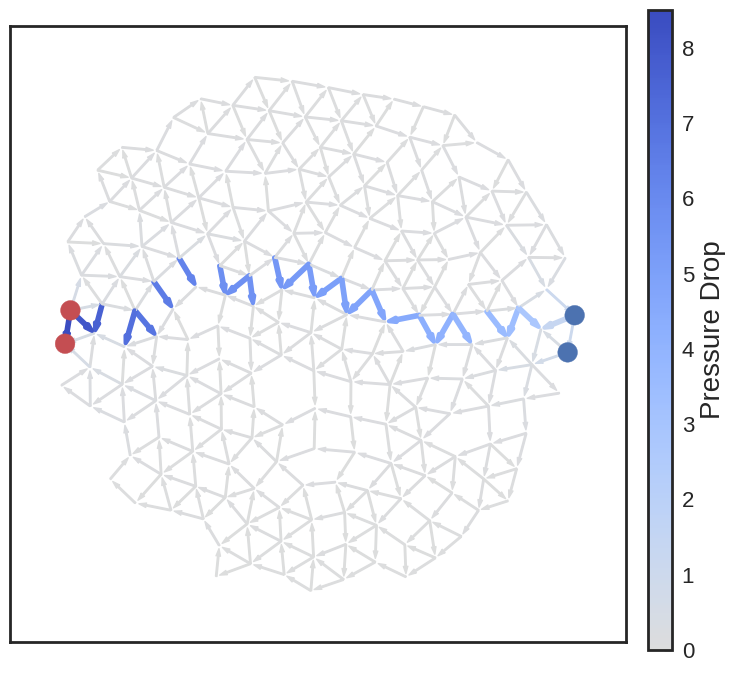

In [8]:
def potential(net, disp):
    edgei = np.copy(net.edgei)
    edgej = np.copy(net.edgej)
    node_pos = np.copy(net.node_pos)
    DIM = net.DIM
    NE = net.NE
    NN = net.NN
    L = np.copy(net.L)
    
    ext = np.zeros(NE, float)
    for i in range(NE):
        
        posi = node_pos[DIM*edgei[i]:DIM*edgei[i]+DIM]
        posj = node_pos[DIM*edgej[i]:DIM*edgej[i]+DIM]

        bvec = posj - posi
        bvec -= np.round(bvec/net.L)*net.L
        
        bhat = bvec / la.norm(bvec)
        
        dispi = disp[edgei[i]]
        dispj = disp[edgej[i]]
        
        ext[i] = dispj - dispi
        
    return ext

mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

disp = data['disp']


removed = np.where(data['K_disc'] == 0.0)[0]


styles = {edge: {} for edge in range(net.NE)}
    
for edge in removed:
    styles[edge]['ls'] = (0.0, (2.0,1.0))
    styles[edge]['lw'] = 6.0
    
ext = potential(net, disp)
        
limit = np.abs(np.max(ext))
norm = mcolors.Normalize(vmin=0.0, vmax=limit)
# norm = mcolors.Normalize(vmin=np.min(ext), vmax=np.max(ext))

ocmap = mpl.cm.coolwarm_r
cmap = mcolors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=ocmap.name, a=0.0, b=1.0),
        ocmap(np.linspace(0.5, 1.0, 100)))


smap = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

for edge in range(net.NE):
    styles[edge]['color'] = smap.to_rgba(np.abs(ext[edge]))
    styles[edge]['orient'] = -np.sign(ext[edge])
    
    
nplot.show_network(ax1, net, styles=styles, oriented=True, alpha=1.0)

styles = {}
for i in inodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
for i in inodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
    
for i in onodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'
for i in onodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'

nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

# nplot.show_vecs(ax1, net, disp)


cax = fig.add_axes([0.925, 0.10, 0.03, 0.80])
cbar = mpl.colorbar.ColorbarBase(cax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')

cbar.ax.tick_params(labelsize=16) 
cbar.set_label("Pressure Drop", fontdict={'fontsize': 20})

ax1.get_xaxis().set_ticks([])
ax1.get_yaxis().set_ticks([])


# plt.savefig("talk_figs/tuned_flow_input_pressure_pressure_drop.png")
plt.savefig("talk_figs/tuned_flow_input_current_pressure_drop.png")



plt.show()

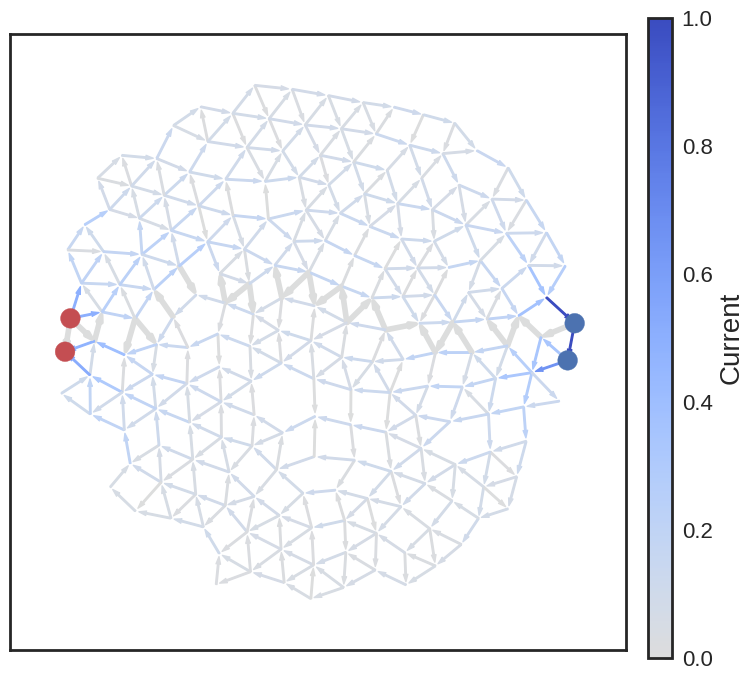

In [10]:
mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})

fig = plt.figure(figsize=(8,8))
ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

disp = data['disp']


removed = np.where(data['K_disc'] == 0.0)[0]


styles = {edge: {} for edge in range(net.NE)}
    
for edge in removed:
    styles[edge]['ls'] = (0.0, (2.0,1.0))
    styles[edge]['lw'] = 6.0
    
    
current = potential(net, disp) * data['K']
        
limit = np.abs(np.max(current))
norm = mcolors.Normalize(vmin=0.0, vmax=limit)
# norm = mcolors.Normalize(vmin=np.min(ext), vmax=np.max(ext))

ocmap = mpl.cm.coolwarm_r
cmap = mcolors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=ocmap.name, a=0.0, b=1.0),
        ocmap(np.linspace(0.5, 1.0, 100)))


smap = mpl.cm.ScalarMappable(norm=norm, cmap=cmap)

   

for edge in range(net.NE):
    styles[edge]['color'] = smap.to_rgba(np.abs(current[edge]))
    styles[edge]['orient'] = -np.sign(current[edge])
    
    
nplot.show_network(ax1, net, styles=styles, oriented=True, alpha=1.0)

styles = {}
for i in inodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
for i in inodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'r'
    
for i in onodesi[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'
for i in onodesj[0]:
    styles[i] = {}
    styles[i]['color'] = 'b'

nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

# nplot.show_vecs(ax1, net, disp)


cax = fig.add_axes([0.925, 0.10, 0.03, 0.80])
cbar = mpl.colorbar.ColorbarBase(cax, cmap=cmap,
                                norm=norm,
                                orientation='vertical')

cbar.ax.tick_params(labelsize=16) 
cbar.set_label("Current", fontdict={'fontsize': 20})

ax1.get_xaxis().set_ticks([])
ax1.get_yaxis().set_ticks([])


plt.savefig("talk_figs/tuned_flow_input_pressure_current.png")
# plt.savefig("talk_figs/tuned_flow_input_current_current.png")



plt.show()

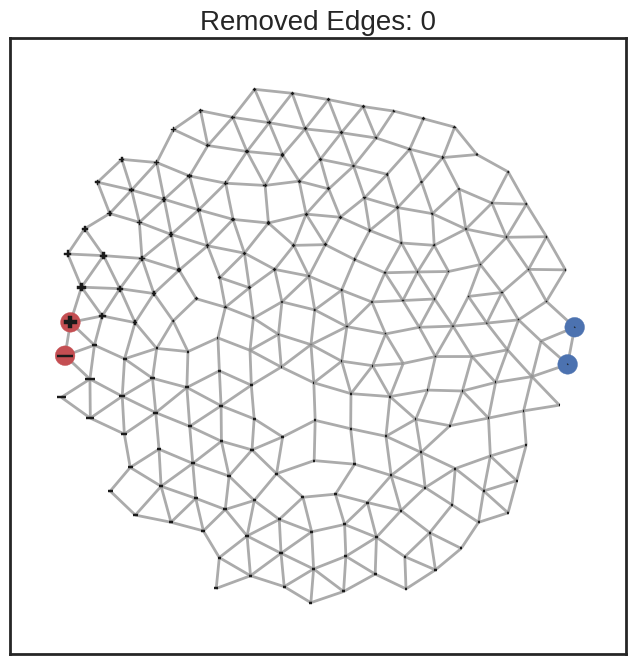

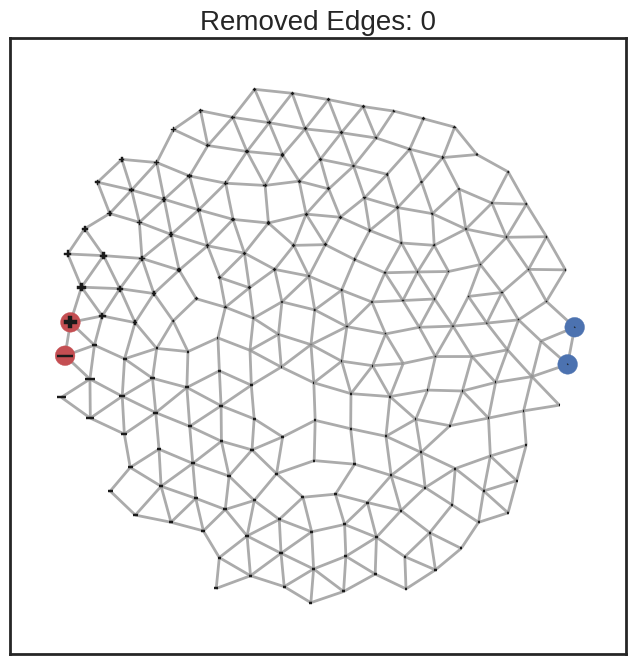

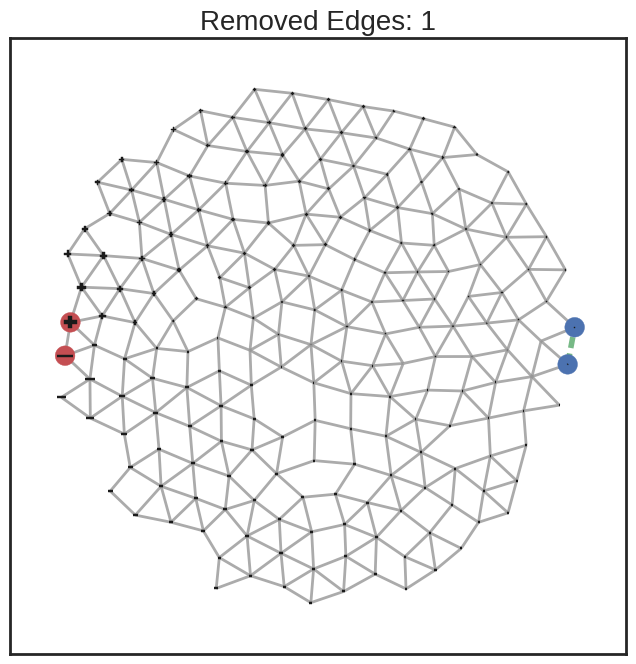

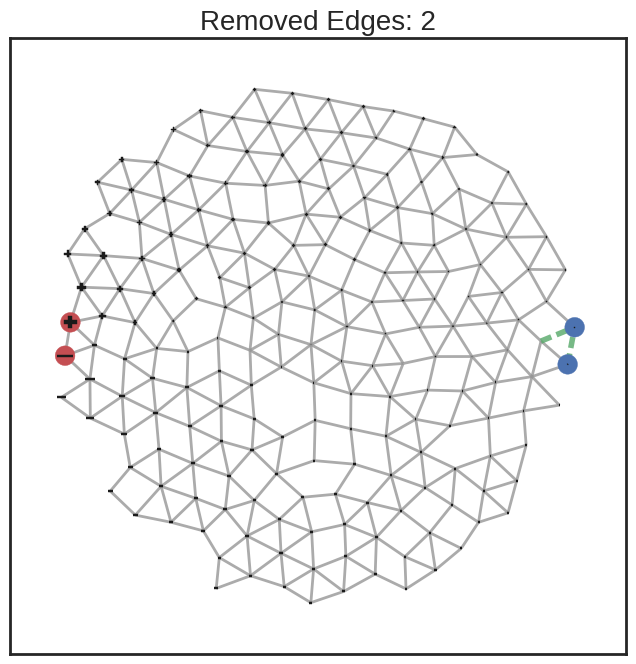

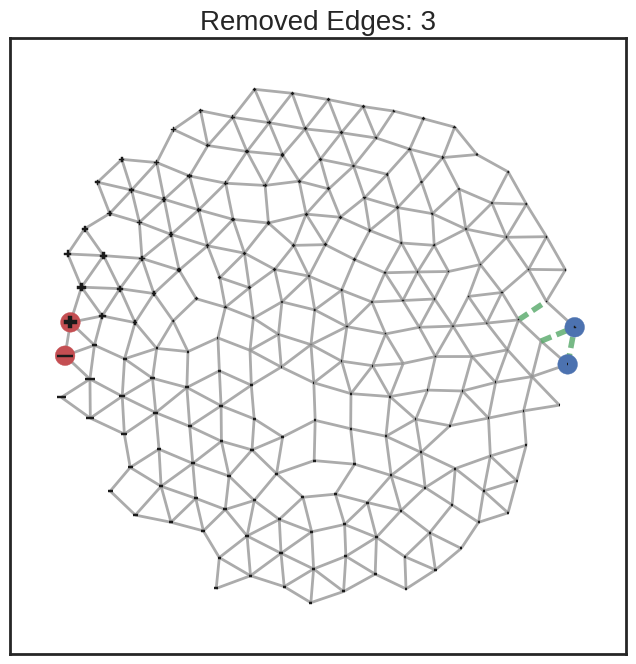

...

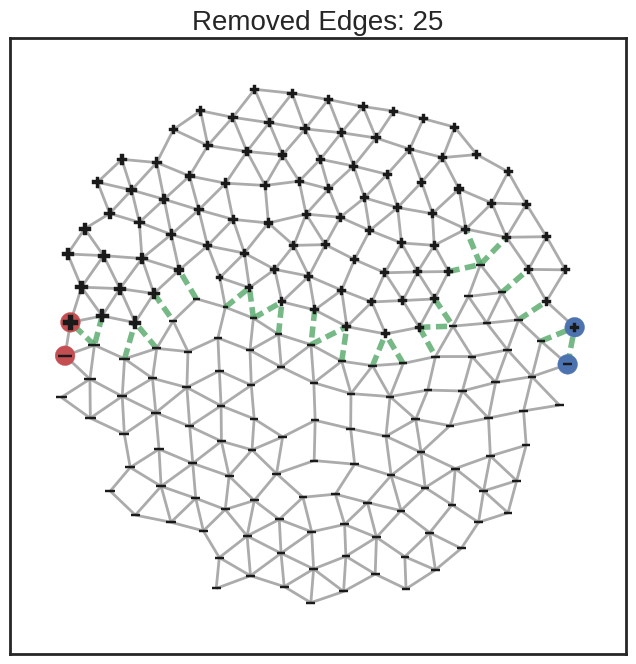

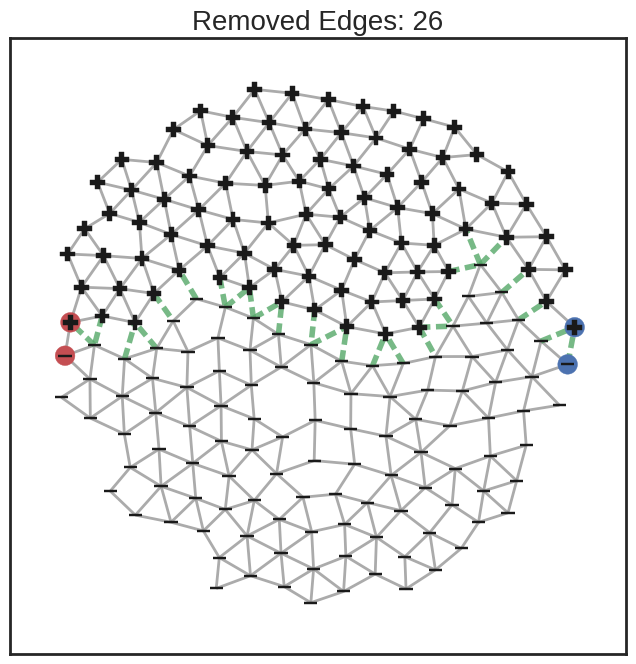

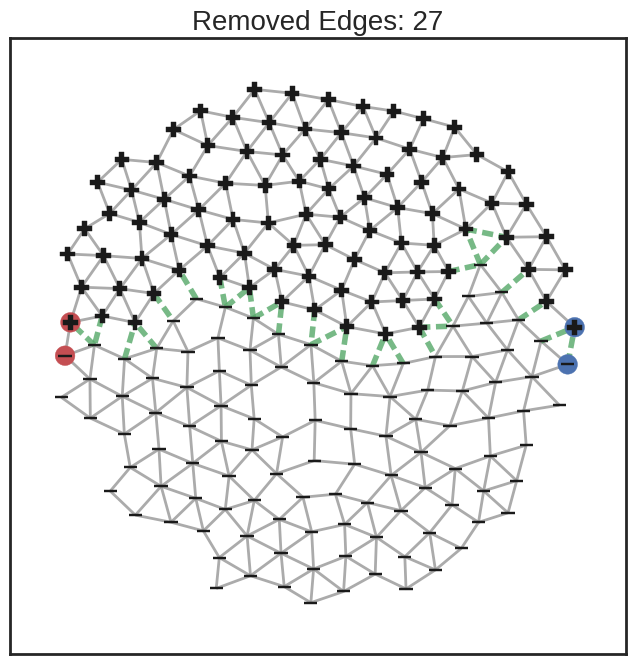

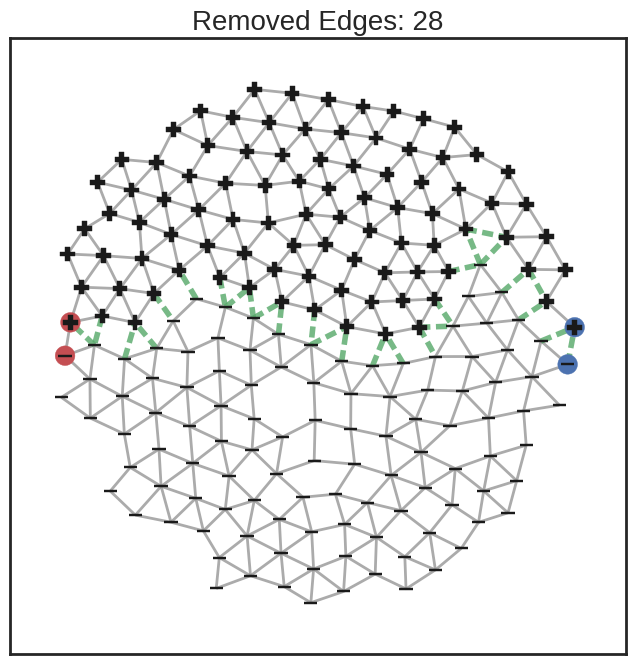

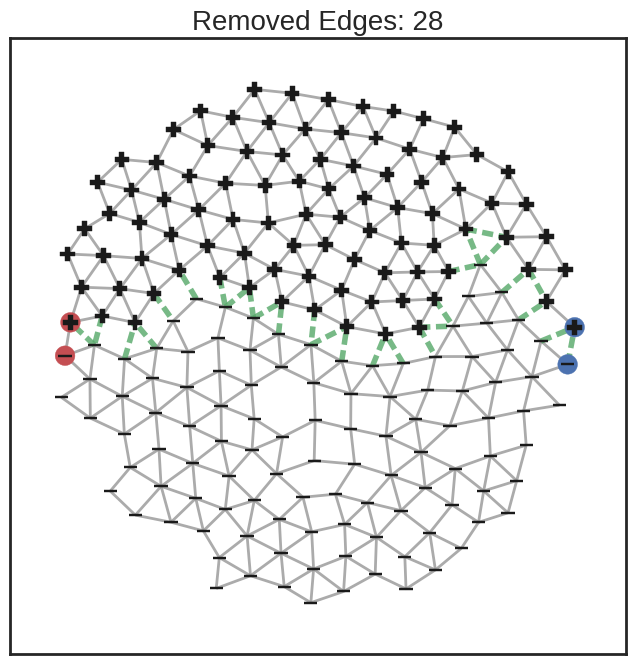

In [21]:
mpl.rcParams['mathtext.fontset'] = 'cm'
sns.set_context('poster', font_scale=1.25)
# sns.set_color_codes(palette='deep')
sns.set(color_codes=True, palette='deep')
# sns.set_palette("muted", 8)
sns.set_style('ticks', {'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 2.0})


rem_bonds = [420, 241, 10, 363, 70, 104, 404, 403, 397, 139, 221, 96, 23, 254, 121, 119, 91, 51, 211, 449, 176, 83, 27, 29, 146, 30, 461, 367]

K = np.copy(K_max)

disp_list = []
K_list = []

tuner.solver.setIntStrengths(K)
(disp, strain) = tuner.solver.solveDOF()
disp_list.append(disp[0])
K_list.append(np.copy(K))
disp_list.append(disp[0])
K_list.append(np.copy(K))

for b in rem_bonds:
    K[b] = 0.0
    
    tuner.solver.setIntStrengths(K)
    (disp, strain) = tuner.solver.solveDOF()
    disp_list.append(disp[0])
    K_list.append(np.copy(K))

disp_list.append(disp[0])
K_list.append(np.copy(K))

for n in range(len(disp_list)):

    fig = plt.figure(figsize=(8,8))
    ax1 = fig.add_subplot(1, 1, 1, aspect=1.0)

    disp = disp_list[n]
    removed = np.where(K_list[n] == 0.0)[0]



    styles = {edge: {} for edge in range(net.NE)}
    for edge in removed:
        styles[edge]['ls'] = (0.0, (2.0,1.0))
        styles[edge]['color'] = 'g'
        styles[edge]['lw'] = 4.0

    nplot.show_network(ax1, net, styles=styles)

    styles = {}
    for i in inodesi[0]:
        styles[i] = {}
        styles[i]['color'] = 'r'
    for i in inodesj[0]:
        styles[i] = {}
        styles[i]['color'] = 'r'

    for i in onodesi[0]:
        styles[i] = {}
        styles[i]['color'] = 'b'
    for i in onodesj[0]:
        styles[i] = {}
        styles[i]['color'] = 'b'

    nplot.show_nodes(ax1, net, styles.keys(), styles=styles)

    styles = {}
    for node in range(net.NN):

        if disp[node] > 0.0:
            styles[node] = {}
            styles[node]['size'] = 200*np.abs(disp[node])

    nplot.show_nodes(ax1, net, styles.keys(), styles=styles, marker='P')

    styles = {}
    for node in range(net.NN):

        if disp[node] < 0.0:
            styles[node] = {}
            styles[node]['size'] = 200*np.abs(disp[node])

    nplot.show_nodes(ax1, net, styles.keys(), styles=styles, marker='_')

    ax1.set_title("Removed Edges: {}".format(len(removed)), {'fontsize': 20})

    ax1.get_xaxis().set_ticks([])
    ax1.get_yaxis().set_ticks([])

    plt.savefig("talk_figs/frames/tuned_flow_input_pressure_frame{:02d}.png".format(n))


    plt.show()



In [23]:
nplot.createGIF("talk_figs/frames/tuned_flow_input_pressure_frame*.png", "{}.gif".format("talk_figs/tuned_flow_input_pressure"), delay=50)